In [ ]:
import tensorflow as tf
print(tf.__version__)
!python --version

2.5.0
Python 3.7.11


In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
%cd '/content/gdrive/MyDrive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI'

/content/gdrive/MyDrive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI


## Cloning TensorFlow Object Detection Repo

In [ ]:
!git clone https://github.com/tensorflow/models.git

Cloning into 'models'...
remote: Enumerating objects: 57945, done.
remote: Counting objects: 100% (345/345), done.
remote: Compressing objects: 100% (174/174), done.
remote: Total 57945 (delta 218), reused 286 (delta 171), pack-reused 57600
Receiving objects: 100% (57945/57945), 573.12 MiB | 13.88 MiB/s, done.
Resolving deltas: 100% (40182/40182), done.
Checking out files: 100% (2510/2510), done.


## Installing Dependencies

In [ ]:
!apt-get install protobuf-compiler python-lxml python-pil
!pip install Cython pandas tf-slim lvis

Reading package lists... Done
Building dependency tree       
Reading state information... Done
protobuf-compiler is already the newest version (3.0.0-9.1ubuntu1).
The following additional packages will be installed:
  python-bs4 python-chardet python-html5lib python-olefile
  python-pkg-resources python-six python-webencodings
Suggested packages:
  python-genshi python-lxml-dbg python-lxml-doc python-pil-doc python-pil-dbg
  python-setuptools
The following NEW packages will be installed:
  python-bs4 python-chardet python-html5lib python-lxml python-olefile
  python-pil python-pkg-resources python-six python-webencodings
0 upgraded, 9 newly installed, 0 to remove and 40 not upgraded.
Need to get 1,614 kB of archives.
After this operation, 8,908 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-bs4 all 4.6.0-1 [67.9 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/main amd64 python-pkg-resources all 39.0.1-2 [128 kB]
Get:3 http:/

## Environment Setup

In [ ]:
%cd '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models/research/'
!protoc object_detection/protos/*.proto --python_out=.

/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models/research


In [ ]:
import os
import sys
os.environ['PYTHONPATH']+=":/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models"
sys.path.append("/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models/research")

In [ ]:
%cd '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models/research/'
!cp object_detection/packages/tf2/setup.py .

/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/models/research


## Install and build Object Detection API

In [ ]:
!python setup.py build
!python setup.py install

running build
running build_py
copying object_detection/protos/anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_predictor_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/argmax_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/bipartite_matcher_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/calibration_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/center_net_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/eval_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_box_coder_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/flexible_grid_anchor_generator_pb2.py -> build/lib/object_detection/protos
copying object_detection/protos/faster_rcnn_pb2.py -> 

## Installation Test

In [ ]:
!python object_detection/builders/model_builder_tf2_test.py

2021-07-23 18:07:10.233919: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
Running tests under Python 3.7.11: /usr/bin/python3
[ RUN      ] ModelBuilderTF2Test.test_create_center_net_deepmac
2021-07-23 18:07:20.740909: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-07-23 18:07:20.790097: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-07-23 18:07:20.790712: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-07-23 18:07:20.790762: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfull

## BCCD Dataset:
- https://github.com/Shenggan/BCCD_Dataset

## Generate TFrecords

In [3]:
 !curl -L "https://public.roboflow.com/ds/YOUR_KEY" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   891  100   891    0     0   1164      0 --:--:-- --:--:-- --:--:--  1163
100 7652k  100 7652k    0     0  7372k      0  0:00:01  0:00:01 --:--:-- 7372k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/cells.tfrecord     
 extracting: test/cells_label_map.pbtxt  
   creating: train/
 extracting: train/cells.tfrecord    
 extracting: train/cells_label_map.pbtxt  
   creating: valid/
 extracting: valid/cells.tfrecord    
 extracting: valid/cells_label_map.pbtxt  


## TFrecords alternative by Python Code

In [ ]:
%cd '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/scripts/'

In [ ]:
!python generate_tfrecord.py -x '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/images/train' -l '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/annotations/label_map.pbtxt' -o '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/annotations/train.record'

In [ ]:
!python generate_tfrecord.py -x '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/images/test' -l '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/annotations/label_map.pbtxt' -o '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/annotations/test.record'

## Training

In [ ]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  try:
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
  except RuntimeError as e:
    print(e)

In [ ]:
!python model_main_tf2.py --model_dir=models/faster_rcnn_resnet50_v1 --pipeline_config_path=models/faster_rcnn_resnet50_v1/pipeline_bccd.config

2021-07-23 18:07:56.926730: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-07-23 18:08:04.029218: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-07-23 18:08:04.036463: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-07-23 18:08:04.037133: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-07-23 18:08:04.037175: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-07-23 18:08:04.042520: I tensorflow/stream_executor/platform/default

In [ ]:
!python exporter_main_v2.py --input_type image_tensor --pipeline_config_path ./models/faster_rcnn_resnet50_v1/pipeline_bccd.config --trained_checkpoint_dir ./models/faster_rcnn_resnet50_v1/ --output_directory ./exported-models/faster_rcnn_resnet50_v1

2021-07-23 21:45:37.386330: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-07-23 21:45:41.005648: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2021-07-23 21:45:41.013483: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2021-07-23 21:45:41.014115: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:00:04.0 name: Tesla T4 computeCapability: 7.5
coreClock: 1.59GHz coreCount: 40 deviceMemorySize: 14.75GiB deviceMemoryBandwidth: 298.08GiB/s
2021-07-23 21:45:41.014150: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2021-07-23 21:45:41.032115: I tensorflow/stream_executor/platform/default

## Tensorboard

In [ ]:
%cd '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/'

%load_ext tensorboard
%tensorboard --logdir=models/faster_rcnn_resnet50_v1

/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace


<IPython.core.display.Javascript object>

## Inference

In [ ]:
import time
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
PATH_TO_SAVED_MODEL="/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/exported-models/faster_rcnn_resnet50_v1/saved_model"
print('Loading model...', end='')

detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

Loading model...Done!


In [ ]:
category_index=label_map_util.create_category_index_from_labelmap("/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/train/cells-bccd_label_map.pbtxt",use_display_name=True)

In [ ]:
img=['/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00382.jpg','/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00410.jpg']
print(img)

['/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00382.jpg', '/content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00410.jpg']


Running inference for /content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00382.jpg... Done


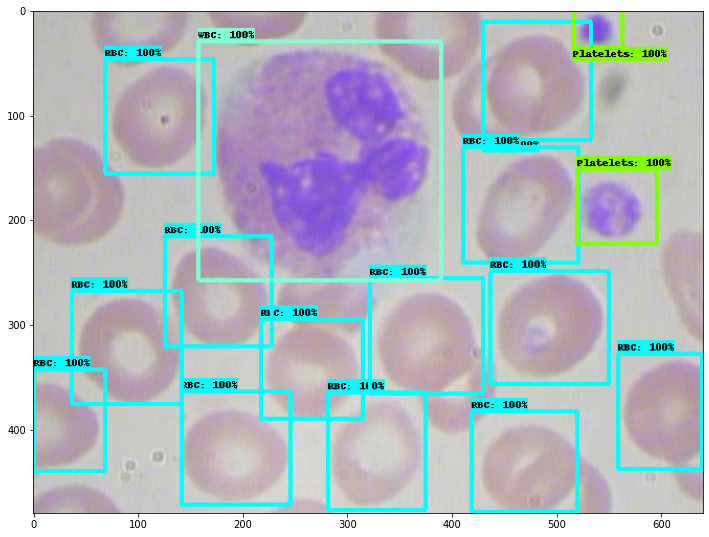

Running inference for /content/gdrive/My Drive/Colab Notebooks/ComputerVisionTF2X/Object_Detection/TF2ODAPI/workspace/BCCD/imgs/BloodImage_00410.jpg... Done


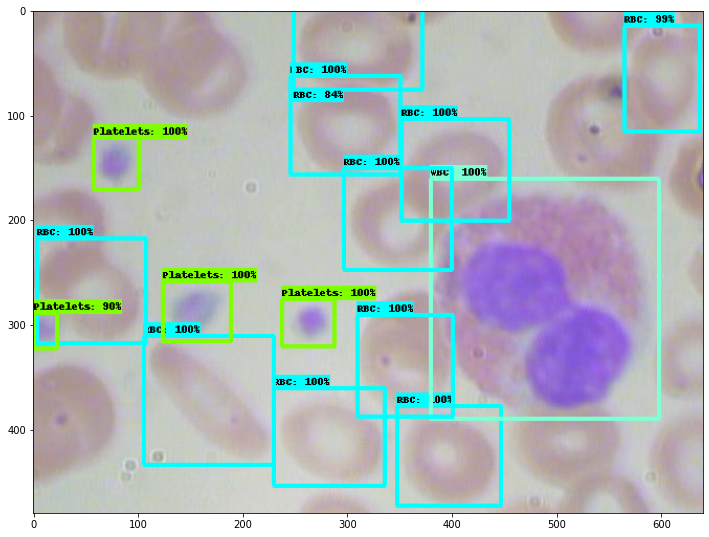

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
def load_image_into_numpy_array(path):
    return np.array(Image.open(path))

for image_path in img:
    print('Running inference for {}... '.format(image_path), end='')
    image_np=load_image_into_numpy_array(image_path)
    input_tensor=tf.convert_to_tensor(image_np)
    input_tensor=input_tensor[tf.newaxis, ...]
    detections=detect_fn(input_tensor)
    num_detections=int(detections.pop('num_detections'))
    detections={key:value[0,:num_detections].numpy()
                   for key,value in detections.items()}
    detections['num_detections']=num_detections
    detections['detection_classes']= detections['detection_classes'].astype(np.int64)
    image_np_with_detections=image_np.copy()
    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=100,     
          min_score_thresh=.5,      
          agnostic_mode=False)
    %matplotlib inline
    plt.figure(figsize=(12,12))
    plt.imshow(image_np_with_detections)
    print('Done')
    plt.show()

## References:
- https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/tf2_detection_zoo.md
- https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/install.html#downloading-the-tensorflow-model-garden
- https://tensorflow-object-detection-api-tutorial.readthedocs.io/en/latest/auto_examples/index.html#examples
